##### 들어가기에 앞서.. 

In [ ]:
# 구글 드라이브 연동 
from google.colab import auth, drive

auth.authenticate_user()
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


한글폰트 적용

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [ ]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic') 

경고메세지 제거


In [ ]:
import warnings
warnings.filterwarnings(action='ignore') 

plotly 시각화

In [ ]:
import plotly.io as pio
pio.renderers.default = "notebook_connected"

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

# **나... 주식한다?**
# **너두? 나두! 야 NA두~**

최근 코로나 이후 주식시장이 활발해졌습니다. 급변하는 금융시장 속에서 많은 젊은 사람들도 너,나 할 것 없이 주식을 시작한다고 합니다.

저희는 주식 투자데이터를 통해 최근 트렌드를 파악하고, Y&Z세대와 X세대의 투자 특징을 분석해 보았습니다. 또한, 모든 세대를 통합해 유사집단군으로 나누어 집단의 특성을 파악하고 Y&Z세대, X세대 그리고 각 집단군의 인사이트를 도출해 내고자 합니다.

## 목표



---

주식시장에 뛰어든 새로운 Y&Z세대 투자자들의 투자 성향을 파악하고, 투자증권은 이들을 어떻게 공략할 것 인가에 대한 인사이트를 도출하고자 합니다.

## Y&Z 세대의 특징 
---
Y세대는 1981~1994년 출생으로 워라밸과 욜로를 핵심가치로 추구하는 세대고, Z세대는 1995년 이후 출생으로 수직적 관계 대신 수평적 관계에서 자유로운 의견 제시와 소통을 추구하는 세대입니다.




 이들은 X세대와 다르게 온라인에 익숙하지만 글로벌 경제위기로 저성장시대를 살아가면서 미래에 대한 꿈보다는 **현실적인 생활에 포커스를 두고 있는 세대**입니다.


## 최근 Y&Z세대의 투자 동향 
---
요즘 Y&Z세대들에게 투자는 선택이 아닌 필수인 시대가 됐습니다. 기준금리가 연 0.5%로 내려앉았고 집값 또한 증가했기 때문입니다. 대학생들은 아르바이트비까지 들며 가세했고, 내 몸 누일 집을 마련해야 한다는 불안감, 이대로는 노후 대비를 할 수 없다는 두려움 등을 안고 투자세계로 등 떠밀리듯 유입됐습니다. 그러나 갓 시장에 뛰어든 이들에겐 투자는 어려움 그 자체이기 때문에 매수, 환매와 같은 기초용어부터 시간외 거래 방법, 재무제표 보는 법 등 기본적으로 알아야 할 것들이 많습니다.

#### *모르는 채로 투자하는 게 찝찝하지만 그렇다고 투자를 접을 순 없습니다.*

## **Ⅰ. data set 준비**







### 1.데이터 불러오기

*  import
*  read
*  labeling

#### import

In [94]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from wordcloud import WordCloud
from sklearn import preprocessing
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
import numpy as np
import matplotlib as mpl
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from plotly.subplots import make_subplots
from IPython.display import Image

#### read

In [85]:
act = pd.read_csv('/content/gdrive/MyDrive/NH/league2/2_act_info.csv')
cus = pd.read_csv('/content/gdrive/MyDrive/NH/league2/2_cus_info.csv')
iem = pd.read_csv('/content/gdrive/MyDrive/NH/league2/2_iem_info.csv')
trd_kr = pd.read_csv('/content/gdrive/MyDrive/NH/league2/2_trd_kr.csv')
trd_oss = pd.read_csv('/content/gdrive/MyDrive/NH/league2/2_trd_oss.csv')

 # 코스피200 종목 데이터
kospi50 = pd.read_csv('/content/gdrive/MyDrive/NH/league2/50.csv')[['종목코드','종목명']]
kospi100 = pd.read_csv('/content/gdrive/MyDrive/NH/league2/100.csv')[['종목코드','종목명']]
kospi200 = pd.read_csv('/content/gdrive/MyDrive/NH/league2/200.csv')[['종목코드','종목명']]
 # 코스피 지수 데이터
ko50 = pd.read_excel('/content/gdrive/MyDrive/NH/league2/코스피50지수.xls')[['일자','현재지수']].rename(columns={'현재지수':'50지수'})
ko200 = pd.read_excel('/content/gdrive/MyDrive/NH/league2/코스피200지수.xlsx')[['일자','현재지수']].rename(columns={'현재지수':'200지수'})
all_ko = pd.read_excel('/content/gdrive/MyDrive/NH/league2/코스피지수.xls')[['일자','현재지수']].rename(columns={'현재지수':'종합지수'})

#### labeling

In [86]:
# 라벨링 
cus = cus.rename(columns={'cus_id':'고객번호', 'sex_dit_cd':'성별','cus_age':'연령대','zip_ctp_cd':'지역','tco_cus_grd_cd':'고객등급','ivs_icn_cd':'고객투자성향'})
act = act.rename(columns={'cus_id':'고객번호','act_id':'계좌번호','act_opn_ym':'계좌개설월'})
iem = iem.rename(columns={'iem_cd':'종목코드','iem_eng_nm':'종목영문명','iem_krl_nm':'종목한글명'})
trd_kr = trd_kr.rename(columns={'act_id':'계좌번호',"orr_dt":"주문날짜","orr_ord":"주문순서","orr_rtn_hur":"주문접수시간대","lst_cns_hur":"최종체결시간대","iem_cd":"종목코드",
                                   "sby_dit_cd":"매매구분코드","cns_qty":"체결수량","orr_pr":"체결가격","orr_mdi_dit_cd":"주문매체구분코드"})
trd_oss = trd_oss.rename(columns={'act_id':'계좌번호',"orr_dt":"주문날짜","orr_ord":"주문순서","orr_rtn_hur":"주문접수시간대","lst_cns_hur":"최종체결시간대","iem_cd":"종목코드",
                                   "sby_dit_cd":"매매구분코드","cns_qty":"체결수량","orr_pr":"체결가격","orr_mdi_dit_cd":"주문매체구분코드","cur_cd":"거래통화코드","trd_cur_xcg_rt":"거래통화환율"})

cus_re = cus.replace({'성별':{1:'남성', 2:'여성'},
                         '지역':{'41':'경기','11':'서울','48':'경남','26':'부산','27':'대구','47':'경북','28':'인천','44':'충남','46':'전남','30':'대전','29':'공주','43':'충북','45':'전북','42':'강원','31':'울산','50':'제주','36':'세종'},
                         '고객투자성향':{'01':'안정형','02':'안정추구형','03':'위험중립형','04':'적극투자형','05':'공격투자형','09':'전문투자자형','00':'정보제공미동의','-':'해당사항없음'},
                         '고객등급':{'01':'탑클래스','02':'골드','03':'로얄','04':'그린','05':'블루','09':'등급없음','-':'해당사항없음'}
                         })

trd_kr_re = trd_kr.replace({'매매구분코드':{1:'매도',2:'매수'},
                               '주문매체구분코드':{1:'영업점단말',2:'유선단말',3:'무선단말MTS',4:'HTS'}})
trd_oss_re = trd_oss.replace({'매매구분코드':{1:'매도',2:'매수'},
                                 '주문매체구분코드':{1:'영업점단말',2:'유선단말',3:'무선단말MTS',4:'HTS'}})

### 2.외부 데이터 추가
#### 코스피 지수 데이터

*   코스피 지수 설명 

KOSPI는 증권거래소에 상장된 기업의 주식가격에 주식수를 가중평균하여 시가총액식으로 산출한 지수를 의미합니다. 증권시장에 상장된 상장기업의 주식 변동을 기준시점과 비교시점을 비교하여 작성한 지표로 주식의 전반적인 동향을 가장 잘 나타내는 대표적인 지수이기도 합니다.



In [87]:
# plotly.express을 이용하여 그래프 그리기
df_ko = pd.merge(all_ko, ko50,'left',on='일자')
df_ko = pd.merge(df_ko, ko200,'left',on='일자')

configure_plotly_browser_state()
init_notebook_mode(connected=False)

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ko['일자'], y=df_ko['종합지수'],
                    mode='lines',
                    name='KOSPI 종합지수'))
fig.add_trace(go.Scatter(x=df_ko['일자'], y=df_ko['200지수'],
                    mode='lines',
                    name='KOSPI 200지수'))
fig.add_trace(go.Scatter(x=df_ko['일자'], y=df_ko['50지수'],
                    mode='lines',
                    name='KOSPI 50지수'))
fig.layout.template = 'plotly_dark'
fig.show()

*   코스피 지수 추가 의도

KOSPI 50,100,200의 종목은 각각 시장을 대표하는 상위 50개, 100개, 200개의 종목들의 주가를 바탕으로 산출하여 나타내는 종합주가지수입니다. 특히, 시장에서는 200지수가 가장많이 활용되고 있습니다. 실제로 코스피 200지수와 코스피 지수의 상관관계는 굉장히 높으며, 코스피 200지수의 구성종목이 코스피의 시가총액 거의 80%이상을 차지하고 있기 때문에 둘은 비슷한 방향으로 움직입니다.

#### 저희는 이를 통해 고객이 대표적인 기업에 투자하는지, 투자자의 개인 투자성향을 도출해 내고자 KOSPI 50,100,200지수의 종목데이터를 활용하였습니다. 

### 3.데이터 통합 및 분할 

In [88]:
df_kr = pd.merge(act,trd_kr_re, how='right',on=("계좌번호"))
df_kr= pd.merge(df_kr,cus_re, how='left',on=("고객번호"))

df_oss = pd.merge(act,trd_oss_re, how='right',on=("계좌번호"))
df_oss= pd.merge(df_oss,cus_re, how='left',on=("고객번호"))
df_oss = pd.merge(df_oss,iem, how='left',on=("종목코드"))

#df_yz = df_kr[df_kr['연령대']<40]
#df_x = df_kr[df_kr['연령대']>=40]

In [89]:
kospi100 = list(set(kospi100['종목명']).difference(set(kospi50['종목명'])))
kospi200 = list(set(kospi200['종목명']).difference(set(kospi50['종목명'])))
kospi200 = list(set(kospi200).difference(set(kospi100)))

# 코스피50 테이블만들기
kospi = pd.DataFrame(columns=['종목한글명', 'kospi'])
for nm in iem['종목한글명']:
  for ko in kospi50['종목명']:
    if ko in nm:
      kospi= kospi.append(pd.DataFrame([(nm, 50 )], columns=['종목한글명', 'kospi']), ignore_index=True)
    else:
      pass
      
# 코스피 100 테이블 
for nm in iem['종목한글명']:
  for ko in kospi100:
    if ko in nm:
      kospi= kospi.append(pd.DataFrame([(nm, 100 )], columns=['종목한글명', 'kospi']), ignore_index=True)
    else:
      pass

# 코스피 200 테이블
for nm in iem['종목한글명']:
  for ko in kospi200:
    if ko in nm:
      kospi= kospi.append(pd.DataFrame([(nm, 200 )], columns=['종목한글명', 'kospi']), ignore_index=True)
    else:
      pass
kospi = kospi.drop_duplicates(['종목한글명'])

# 전처리 : NAN값은 코스피지수 200 초과의 종목으로 300으로 입력
ko_iem = pd.merge(iem,kospi,how='left',on='종목한글명').fillna(300)
df_kr = pd.merge(df_kr,ko_iem,how='left',on='종목코드')
# df_kr.isnull().sum()

In [90]:
#국내 데이터 세대별 분류
df_yz = df_kr[df_kr['연령대']<40]
df_x = df_kr[df_kr['연령대']>=40]

#해외 데이터 세대별 분류
oss_yz = df_oss[df_oss['연령대']<40]
oss_x = df_oss[df_oss['연령대']>=40]

## **Ⅱ. data 분석 및 시각화**

### **1. Y&Z세대 투자 데이터 분석을 통한 인사이트 도출**

먼저, Y&Z세대 투자자 데이터 분석을 위해 cus_info(이하 cus)를 이용했습니다.

In [91]:
#고객데이터에서의 연령대 분류

cus_yz = cus_re[cus_re['연령대']<40]
cus_x = cus_re[cus_re['연령대']>=40]

##### 1-1. 성별

In [122]:
y_pie_sex = cus_yz['성별'].value_counts() #성별 기준으로 시리즈 생성
x_pie_sex = cus_x['성별'].value_counts() 

df_act = pd.DataFrame(y_pie_sex).reset_index() #데이터프레임 후 인덱스 재설정
df_act_x = pd.DataFrame(x_pie_sex).reset_index()

df_act = df_act.rename({'index':'성별','성별':'명 수'},axis='columns') #컬럼이름 변경
df_act_x = df_act_x.rename({'index':'성별','성별':'명 수'},axis='columns')

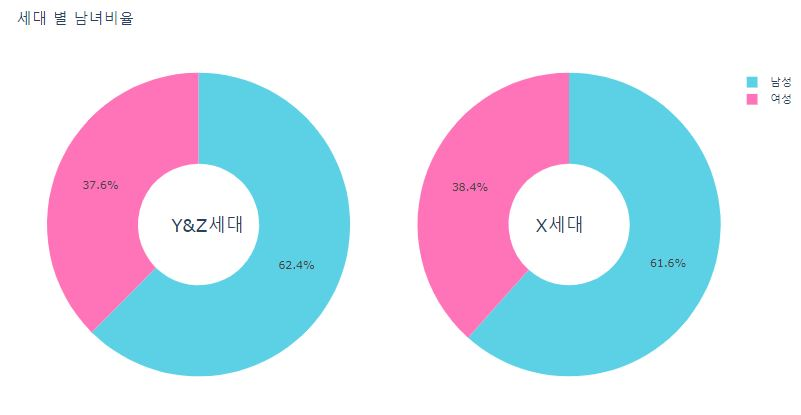

In [147]:
'''
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=df_act['성별'], values=df_act['명 수'], sort = False,marker_colors=['#5CD1E5','#FF73B8'],hole=.4), 1, 1)
fig.add_trace(go.Pie(labels=df_act_x['성별'], values=df_act_x['명 수'], sort = False,hole=.4), 1, 2)
fig.update_layout(title_text='세대 별 남녀비율', legend = {"traceorder" : "normal"},
                  annotations=[dict(text='Y&Z세대', x=0.18, y=0.5, font_size=20, showarrow=False),
                               dict(text='X세대', x=0.8, y=0.5, font_size=20, showarrow=False)])
fig.show()
'''
Image('/content/gdrive/MyDrive/NH/pic/남녀.JPG')

Y&Z세대의 성별비율은 남성이 약 62%, 여성이 약 38% 였으며 X세대 또한 비슷한 비율을 나타냈습니다.

##### 1-2. 지역(시도)

Text(0.5, 1.0, 'YZ세대 지역별 인원수')

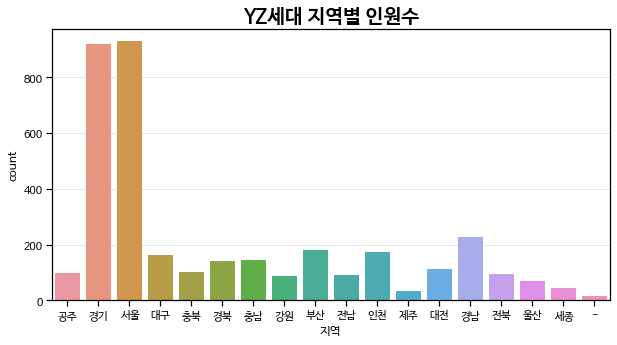

In [163]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 10,5

ax=sns.countplot(cus_yz['지역'])
ax.set_title('YZ세대 지역별 인원수',fontweight ="bold",fontsize =20)

##### 1-3. 고객투자성향

해당사항이 없는 경우는 결측치로 간주하였습니다. 이를 위해 '해당사항없음'의 데이터를 None 으로 처리하여 시각화를 진행했습니다. 

Text(0.5, 1.0, 'X세대 고객투자성향')

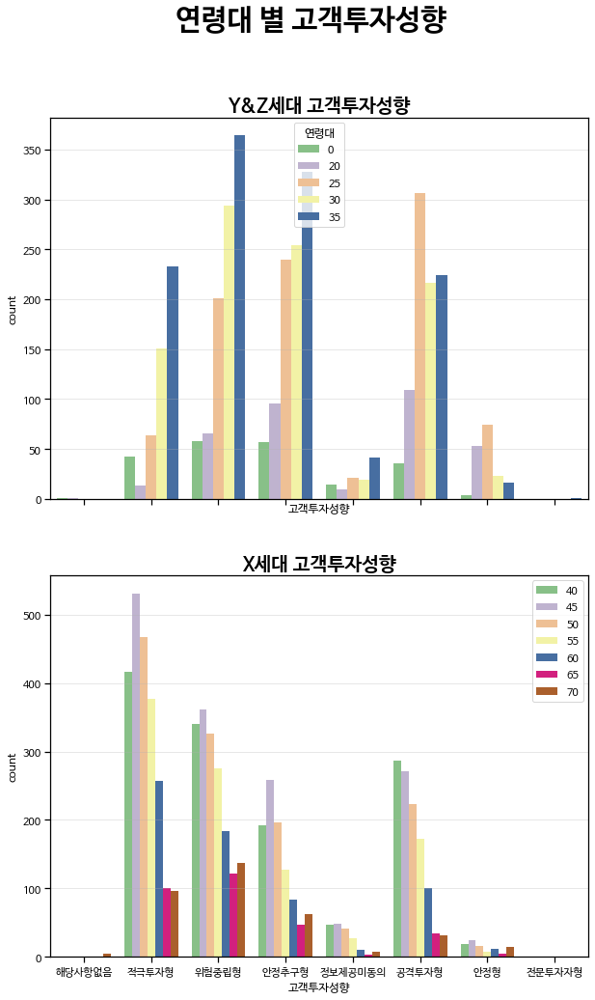

In [155]:
# 결측치 처리
cus_nan = cus_yz.replace('해당사항없음',None)
x_nan = cus_x.replace('해당사항없음',None)
sns.set_context("notebook")

# X세대 투자성향
plt.rcParams["axes.grid"] = True
plt.rcParams['grid.alpha'] = 0.3
f,axes = plt.subplots(2,1, figsize=(10,16), sharex=True)
f.suptitle('연령대 별 고객투자성향',fontweight ="bold",fontsize =30)

bx = sns.countplot(data=cus_nan, x='고객투자성향',hue='연령대',palette='Accent',ax=axes[0])
bx.set_title('Y&Z세대 고객투자성향',fontweight ="bold",fontsize =20)

ax=sns.countplot(data=x_nan, x='고객투자성향',hue='연령대',palette='Accent',ax=axes[1])
ax.legend(loc='upper right')
ax.set_title('X세대 고객투자성향',fontweight ="bold",fontsize =20)

Y세대의 경우, 위험중립형, 적극투자형, 안정추구형 순으로 많았습니다. 이는 매우 안정적인 투자보다는 어느정도 위험을 감수하는 투자를 선호한다는 것을 알 수 있습니다.  
  
- 다음의 박스플롯 시각화를 통해 전 세대를 한번에 비교해볼 수 있습니다.

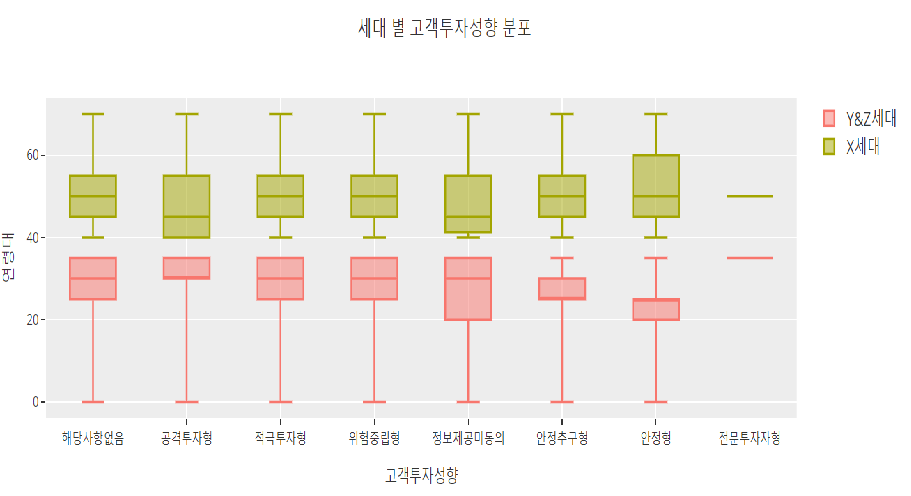

In [156]:
Image('/content/gdrive/MyDrive/NH/pic/투자성향.png')

#### 1-4. 고객등급

In [99]:
#결측치 처리
yz_nan =cus_yz.replace('등급없음',None)
x_nan =cus_x.replace('등급없음',None)

Text(0.5, 1.0, 'X세대 고객 등급')

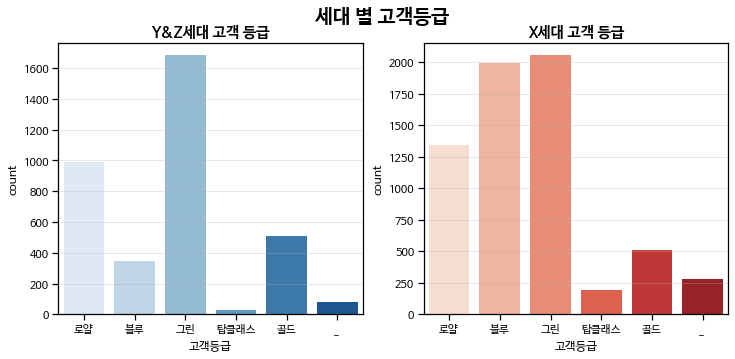

In [100]:
f,axes = plt.subplots(1,2, figsize=(12,5), sharex=True)
f.suptitle('세대 별 고객등급',fontweight ="bold",fontsize =20)

#Y새대 고객등급
rcParams['figure.figsize'] = 8,5
ax = sns.countplot(yz_nan["고객등급"],palette ='Blues',ax=axes[0])
ax.set_title('Y&Z세대 고객 등급',fontweight ="bold",fontsize =15)

#X새대 고객등급
rcParams['figure.figsize'] = 8,5
bx = sns.countplot(x_nan["고객등급"],palette ='Reds',ax=axes[1])
bx.set_title('X세대 고객 등급',fontweight ="bold",fontsize =15)

Y&Z세대의 경우, **그린 > 로얄 > 골드 > 블루** 순으로 많았습니다. 젊은 세대의 경우 현재 계좌를 개설하고 주식을 활발히 하기 때문에 자산은 없지만 수익기여도를 만족하여 이와 같은 결과가 나왔다고 생각합니다. 

X세대의 경우, **그린 = 블루 > 로얄 > 골드 > 탑클래스** 순으로 많았습니다. Y세대와 다르게 블루 등급이 그립 등급의 비율과 비슷합니다. 이는 계좌는 가지고 있으나 주식을 적극적으로 하지 않는 X세대의 모습이 반영된 것 같습니다.

  
- 다음의 박스플롯 시각화를 통해 전 세대의 고객등급을 한번에 비교해볼 수 있습니다.



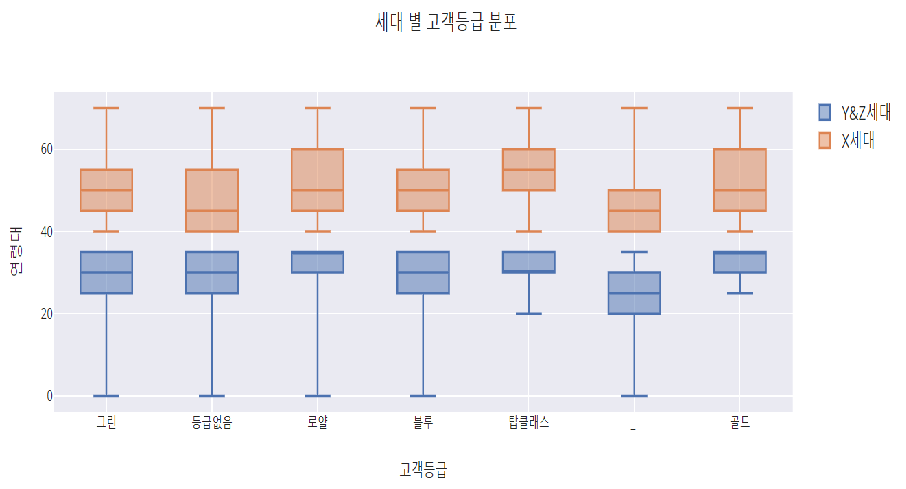

In [157]:
Image('/content/gdrive/MyDrive/NH/pic/고객등급.png')

**고객등급 별 고객투자성향 비교**

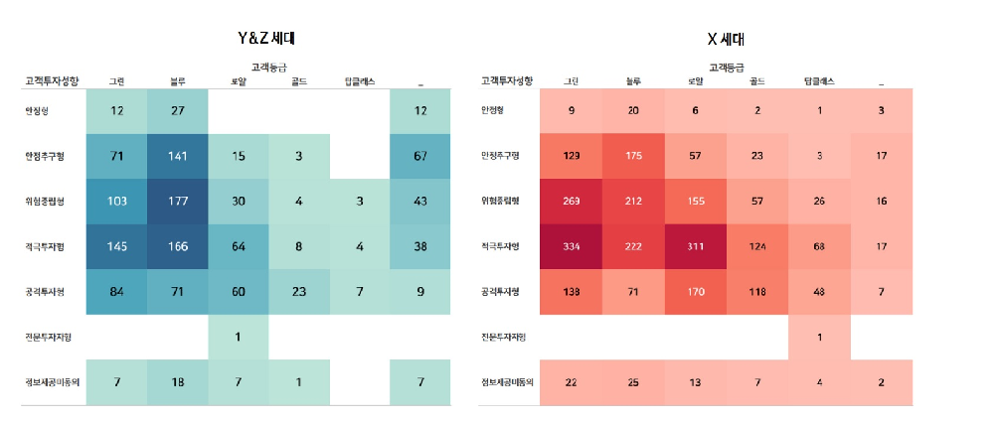

In [158]:
Image('/content/gdrive/MyDrive/NH/pic/히트맵.png')

고객등급과 고객성향을 heatmap으로 비교해보았습니다. 

Y&Z세대의 경우, 블루등급의 위험중립형이 177명으로 가장 많았습니다. 이는 꾸준히 투자를 하며 어느정도 위험을 감수하는 경향이 있는 투자자가 주를 이루는 것으로 해석됩니다. 

반대로 X세대의 경우, 그린등급의 적극투자형이 334명, 로얄등급의 적극투자형이 311명으로 많았습니다. 그린등급인 투자자들은 투자를 꾸준히 하진 않지만 하게 될 경우, 적극적인 모습인 것으로 해석되며 로얄등급의 투자자들은 자산과 수익기여도에 따라 더 큰 수익을 위해 과감히 투자하는 것으로 해석됩니다. 

#### 1-5. 주문매체코드

주문매체코드는 trd_kr에 있으므로 데이터프레임을 병합한 df_yz를 사용했습니다. 

Text(0.5, 1.0, 'X세대 주문매체')

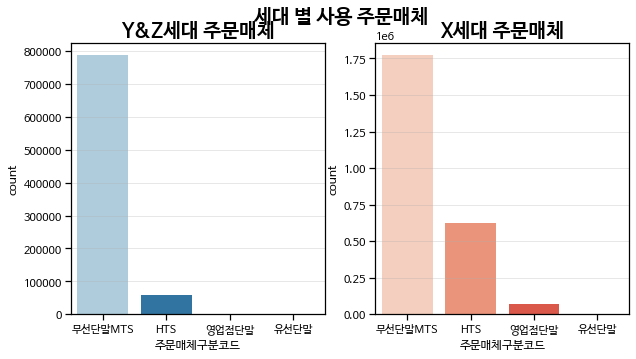

In [160]:
#Y세대 국내 주문 매체 비율
rcParams['figure.figsize'] = 5,2
f,axes = plt.subplots(1,2, figsize=(10,5), sharex=True)
f.suptitle('세대 별 사용 주문매체',fontweight ="bold",fontsize =20)

ax = sns.countplot(x='주문매체구분코드',palette='Paired',data=df_yz,ax=axes[0])
ax.set_title('Y&Z세대 주문매체',fontweight ="bold",fontsize =20)

bx = sns.countplot(x='주문매체구분코드',palette ='Reds',data=df_x,ax=axes[1])
bx.set_title('X세대 주문매체',fontweight ="bold",fontsize =20)
#1: 영업점단말 2: 유선단말 3: 무선단말 MTS 4: HTS

현재 스마트폰 등을 통한 모바일트레이딩시스템이 기존의 영업단말과 홈트레이딩시스템(HTS)을 제치고 가장 많이 이용하는 주식 거래 플랫폼임을 알 수 있습니다.

스마트폰과 온라인에 익숙한 YZ세대는 압도적으로 무선단말의 비중이 높았고, X세대에서는 홈트레이딩시스템(HTS)과  영업점 단말의 비중이  YZ세대보다 높게 나타났습니다.

#### 1-6. 체결수량

Y&Z 세대는 한번 거래할 때 보통 몇개의 수량을 하는지 파악하기 위해 pie chart를 이용하였습니다.

In [ ]:
#체결수량을 기준으로 정렬
y_pie_cns = df_yz['체결수량'].value_counts().head(10)

#종목코드를 기준으로 내림차순 정렬
gro_cns=df_yz.groupby('체결수량').count()
gro_cns=gro_cns.sort_values(by=['종목코드'],axis=0,ascending=False)
gro_cns=gro_cns.head(10) #상위 10개 추출

gro_cns_x=df_x.groupby('체결수량').count()
gro_cns_x=gro_cns_x.sort_values(by=['종목코드'],axis=0,ascending=False)
gro_cns_x=gro_cns_x.head(10) #상위 10개 추출

#시각화를 위해 '종목코드'컬럼만 추출
gro_cns = gro_cns[['종목코드']]
gro_cns_x=gro_cns_x[['종목코드']]

#컬럼명 재설정
gro_cns= gro_cns.rename({'종목코드':'count'},axis='columns')
gro_cns_x = gro_cns_x.rename({'종목코드':'count'},axis='columns')
#인덱스 재설정
gro_cns=gro_cns.reset_index()
gro_cns_x=gro_cns_x.reset_index()

In [ ]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'},{'type':'domain'}]],subplot_titles = ['Y&Z세대','X세대'])
fig.add_trace(go.Pie(labels=gro_cns['체결수량'], values=gro_cns['count'], sort = True,name='Y&Z세대',marker_colors=['#CC3D3D','#FFA7A7','#FFE08C','#CEF279','#B2EBF4','#B5B2FF','#BDBDBD'], pull=[0, 0,0, 0,0,0,0,0,0,0.3]), 1, 1)
fig.add_trace(go.Pie(labels=gro_cns_x['체결수량'], values=gro_cns_x['count'], sort = True, name='X세대',pull=[0, 0,0, 0,0,0,0,0,0.3,0.3]), 1, 2)
fig.update_layout(title_text='Y&Z세대와 X세대의 한 거래당 체결 수량 비교', legend = {"traceorder" : "normal"})
fig.show()

YZ세대와 X세대 모두 체결할 때의 수량이 1인 경우가 약 23-24%로 가장 많았습니다. 두 세대별 특징적인 부분은, X세대에서는 한 거래당 체결수량이 500주, 1000주가 10위권안에 들었던 반면 YZ세대는 10위권 안의 최대 체결수량은 약 5%의 200주인 것을 확인 할 수 있었습니다. 

이를 통해, 앞에서 보았던 X세대의 높은 고객등급(골드, 탑클래스)비율이 보유자산과 수익기여도를 통해 한 거래당 많은 체결수량에 영향을 미치는 것으로 예상합니다. 
또한, YZ세대는 한 거래당 적은 체결수량으로 소량씩 매수매도하는 모습을 보였습니다. 

#### 1-7. KOSPI 지수

Text(0.5, 1.0, 'X세대')

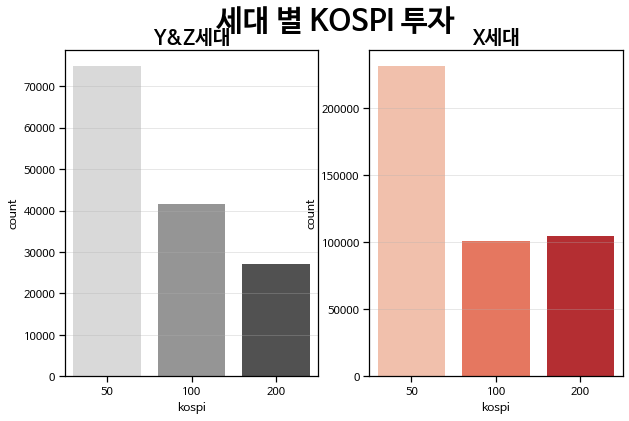

In [161]:
#코스피200 외 주식종목 제외
yz_not_300 = df_yz[df_yz['kospi'] == 300].index
yz_not_300 = df_yz.drop(yz_not_300) 

x_not_300 = df_x[df_x['kospi'] == 300].index
x_not_300 = df_x.drop(x_not_300)

f,axes = plt.subplots(1,2, figsize=(10,6), sharex=True)
f.suptitle('세대 별 KOSPI 투자',fontweight ="bold",fontsize =30)   

yx = sns.countplot(data=yz_not_300, x='kospi',palette='Greys',ax=axes[0])
yx.set_title('Y&Z세대',fontweight ="bold",fontsize =20)

ax=sns.countplot(data=x_not_300, x='kospi',palette='Reds',ax=axes[1])
ax.set_title('X세대',fontweight ="bold",fontsize =20)

코스피 200 만을 보았을 때, 모든 세대가 코스피 50에 투자한 계좌가 가장 많았습니다. 특히50종목, 100종목, 200종목의 순서로 많은 투자를 하는 YZ세대의 대부분 투자자들은 안정적인 대형주일수록 투자하는 것을 선호한다고 볼 수 있었습니다.  

그러나 X세대는 코스피 100이내 종목보다는 200종목 거래가 조금 더 많았습니다.  이는, YZ세대보다 개인의 주관을 고려하여 투자에 반영하는 것으로 보입니다.

#### 1-8. 거래흐름

먼저 Y&Z세대의 거래량을 통해 거래 흐름을 파악했습니다. 

Text(0.5, 1.0, 'X세대 해외거래 흐름')

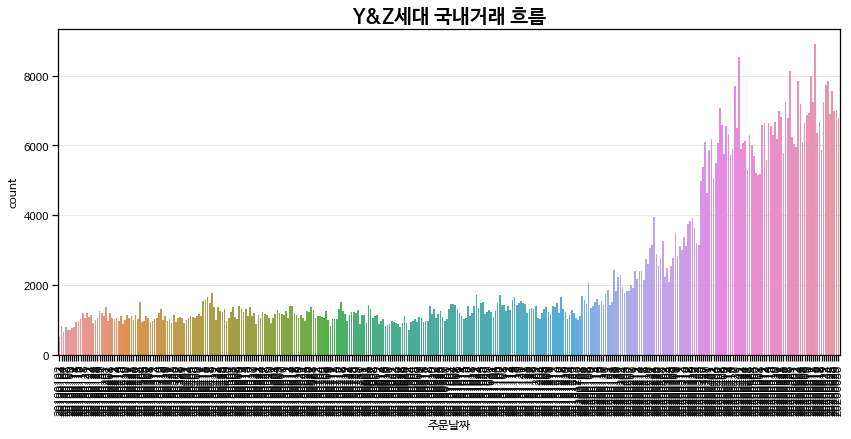

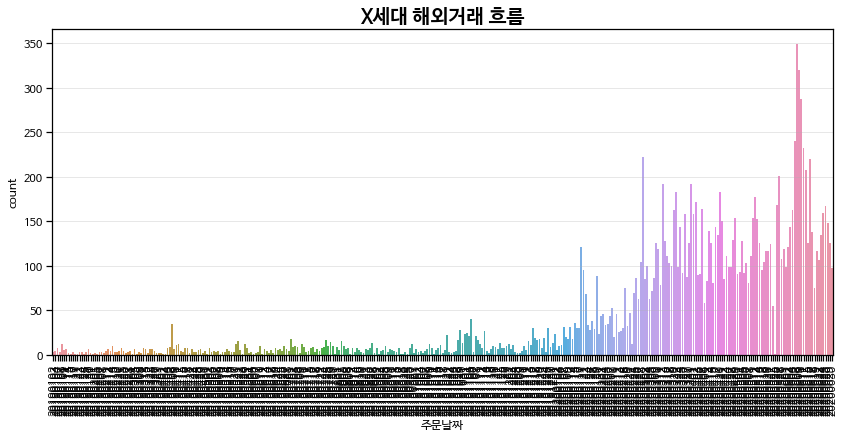

In [172]:
# 국내 데이터 거래량
plt.figure(figsize=(14,6))
plt.xticks(rotation =90 )
ax=sns.countplot(x="주문날짜", data=df_yz)
ax.set_title('Y&Z세대 국내거래 흐름',fontweight ="bold",fontsize =20)
#해외 데이터 거래량
plt.figure(figsize=(14,6))
plt.xticks(rotation =90 )
bx=sns.countplot(x="주문날짜", data=oss_yz)
bx.set_title('X세대 해외거래 흐름',fontweight ="bold",fontsize =20)

국내의 경우, 거래량이 꾸준히 증가하는 양상을 보이며 3,4월에 약간 더 상승한 것을 볼 수 있습니다. 

이와 반대로 해외의 경우, 거래량이 거의 없다가 올해부터 조금씩 증가하여 6월달에 정점을 찍은 것을 볼 수 있습니다. 따라서 6월달에 해외거래에서 어떤 주식종목을 많이 거래했는지 알아보겠습니다.  

In [ ]:
#2020년 06월 추출
yz_202006= (oss_yz['주문날짜']>=20200300) & (oss_yz['주문날짜']<=20200331) # 2020년 6월 데이터 추출
yz_202006= oss_yz[yz_202006]

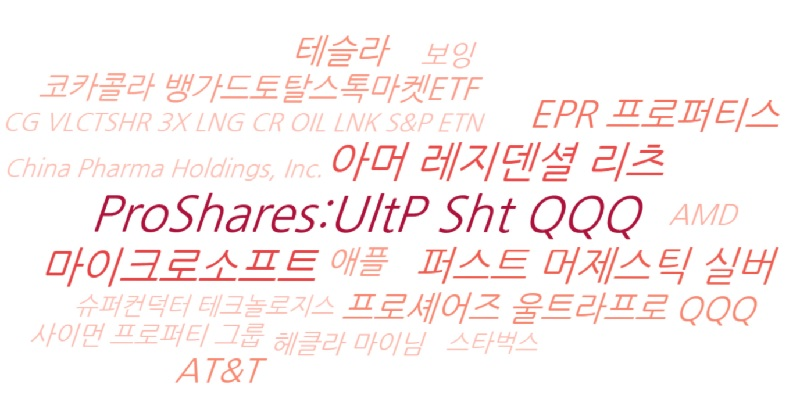

In [ ]:
from IPython.display import Image
Image('/content/gdrive/MyDrive/NH/pic/해외.JPG')

가장 거래량이 높았던 종목은 미국의 프로셰어즈 울트라숏 QQQ 입니다. 이 종목은 지수가 10%오르면 30% 수익을 내지만 반대로 10%하락하면 30% 떨어지는 종목으로 과감히 투자하는 모습입니다.

국내 개인 투자자는 '변동성이 큰 국내보다 꾸준히 상승하는 해외 주식을 사는게 더 낫다'라고 판단하여 해외주식을 매수하는 것으로 보여집니다. 

#### 1-9. 계좌개설월

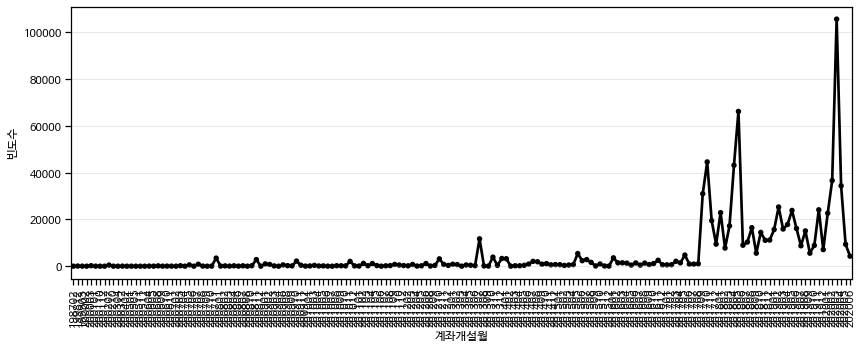

In [173]:
#계좌개설월을 기준으로 정렬
y_pie_act = df_yz['계좌개설월'].value_counts()

df_act = pd.DataFrame(y_pie_act) #시리즈를 데이터프레임으로 변환
df_act = df_act.reset_index() # 인덱스 재설정

df_act = df_act.rename({'index':'계좌개설월','계좌개설월':'빈도수'},axis='columns') #컬럼명 변경

#Y세대 계좌개설월
plt.figure(figsize=(14,5))
plt.xticks(rotation =90)
sns.pointplot(x='계좌개설월',y='빈도수',markers='.',color='k',data=df_act)

계좌개설월을 시계열 그래프로 시각화했습니다. 2017년 9월부터 계좌를 만드는 고객이 급증하였고 이 때부터 주식을 시작하는 사람들이 늘어났다고 보여집니다. 그 이후로 증감을 반복하다 코로나가 대유행했던 3월달에 신규계좌가 폭발적으로 증가했습니다. 

2017년 9월의 거래 데이터는 존재하지 않으므로 가장 폭발적으로 증가했던 2020년 3월 거래 데이터를 분석했습니다. 

In [ ]:
#2020년 03월 추출
yz_202003= (df_yz['주문날짜']>=20200300) & (df_yz['주문날짜']<=20200331) # 2020년 3월 데이터 추출
yz_202003= df_yz[yz_202003]

#Y세대 주식종목 비율
gro_iem=df_yz.groupby('종목한글명').count()
gro_iem=gro_iem.sort_values(by=['종목코드'],axis=0,ascending=False)
gro_iem=gro_iem.head(20)
gro_iem= gro_iem[['계좌번호']]
gro_iem=gro_iem.reset_index()
gro_iem = gro_iem.rename(columns={'계좌번호':'개수'})


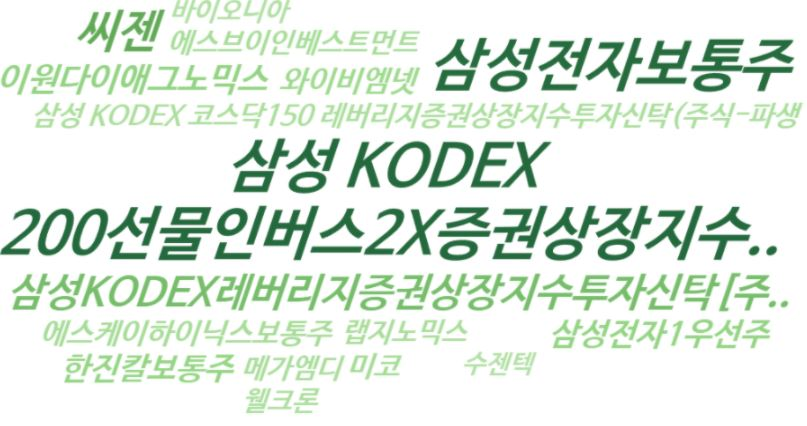

In [121]:
Image('/content/gdrive/MyDrive/NH/pic/국내.jpg')

앞서 확인했던 것처럼 코스피 50에 해당하는 삼성 관련 주식이 상위권을 차지했습니다. 

3월에 가장 많이 거래된 삼성 KODEX 200 선물인버스 2X 상품을 조사해본 결과, 
이 종목은 코로나 발발 때 동학개미들의 많은 주목을 받았다고 합니다. 2020년 2월 경 5,700원 대였던 주가가 2020년 주가 대폭락의 영향으로 3월 19일 12,815원까지 찍으며 인버스 투자자들에게 많은 수익을 안겨다 주었다고 합니다. 

시계열 그래프에서 확인할 수 있었던 것 처럼 코로나로 인해 주식시장의 변동이 컸으며, Y&Z세대는 이러한 변화와 이슈에 많이 흔들리는 것을 알 수 있습니다. 

#### 1-10. 고객 ID당 계좌 수 및 계좌 당 거래수 

한명의 고객이 여러개의 계좌를 보유하고 있는 경우가 있습니다. 저희는 투자데이터를 이용하여 고객 ID 당 계좌 수를 구하고, 그에 해당하는 인사이트를 도출했습니다.

In [109]:
#고객 ID 당 보유 계좌수

act_df = act.groupby(['고객번호']).count().sort_values(by='고객번호',ascending=False )
act_df.reset_index(inplace=True)
act_df = act_df.drop(['계좌개설월'], axis=1)  # act_opn_ym 컬럼 제거
act_df =act_df.rename({'계좌번호':'보유계좌수'}, axis='columns') # 컬럼 이름 변경

#계좌 당 거래횟수
act_ct = trd_kr.groupby(['계좌번호'])['주문날짜'].agg(['count']).sort_values(by='count')
act_ct.reset_index(inplace=True)

#계좌 별 거래수 count 컬럼 추가
df_act = pd.merge(act,act_ct, how='left',on=('계좌번호'))

# 결측치인 값은 거래가 없는 계좌이므로 0처리
df_act = df_act.fillna(0)

고객 ID 별로 보유하고 있는 계좌수를 데이터프레임으로 나타냈습니다. 이를 바탕으로 계좌가 제일 많은 TOP3 고객이 실제로 몇개 사용하는지 알아보았습니다.

In [110]:
# 고객ID별 실사용계좌 수 
dff = pd.DataFrame(columns=['고객번호', 'count'])
a=[]
for i in df_act['고객번호']:
  if i in a:
    pass
  else:
    cus_ct = df_act[df_act['고객번호']==i]
    dff= dff.append(pd.DataFrame([(i, cus_ct[cus_ct['count']!=0].count()['count'] )], columns=['고객번호', 'count']), ignore_index=True)
    a.append(i)

dff.sort_values(by='count',ascending=False)

# 실사용 계좌수
dff =dff.rename({'count':'사용계좌수'}, axis='columns') # 컬럼이름 변경

# 데이터프레임 합치기
use_act = pd.merge(act_df,dff, how='left',on=("고객번호"))

# 사용율 계산
use_act['사용율'] = 100*use_act['사용계좌수']/use_act['보유계좌수']

# 고객데이터에 합치기
data = pd.merge(use_act, cus, how='left', on='고객번호')
data[['사용계좌수','사용율']] = data[['사용계좌수','사용율']].astype(int)

# 세대별로 데이터 분할
x = data[data['연령대'] >= 40]
yz = data[data['연령대'] < 40]


실제로 사용하는 계좌는 보유한 계좌에 비해 굉장히 적음을 알 수 있습니다. 저희는 단 세명의 고객이 아닌 전체 고객의 사용율을 구하여 이를 세대별로 나누어 비교했습니다. 

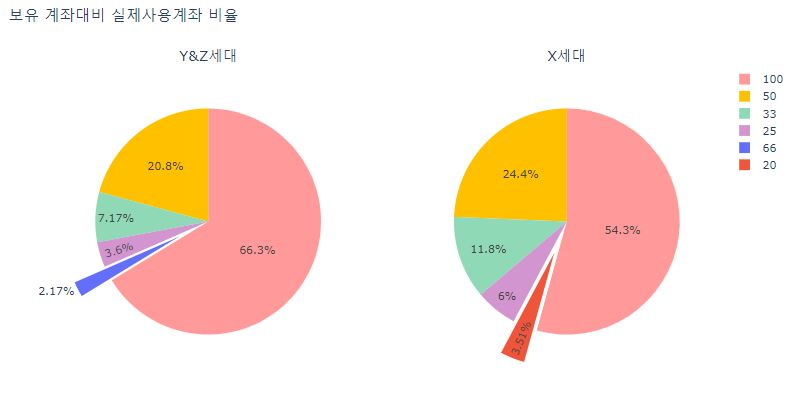

In [148]:
'''
configure_plotly_browser_state()
init_notebook_mode(connected=False)

colors = ['#ff9999', '#ffc000', '#8fd9b6', '#d395d0']
wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5}

# yz세대 
eyz = yz['사용율'].value_counts()[yz['사용율'].value_counts(normalize=True)>0.02].to_frame()
eyz.reset_index(inplace=True)
# x세대 
exx = x['사용율'].value_counts()[x['사용율'].value_counts(normalize=True)>0.02].to_frame()
exx.reset_index(inplace=True)

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'},{'type':'domain'}]],subplot_titles = ['Y&Z세대','X세대'])
fig.add_trace(go.Pie(labels=eyz['index'], values=eyz['사용율'], sort = True,name='Y&Z세대',marker_colors=colors, pull=[0, 0,0, 0,0.3]), 1, 1)
fig.add_trace(go.Pie(labels=exx['index'], values=exx['사용율'], sort = True, name='X세대',pull=[0, 0,0, 0,0.3]), 1, 2)
fig.update_layout(title_text='보유 계좌대비 실제사용계좌 비율', legend = {"traceorder" : "normal"})
'''
Image('/content/gdrive/MyDrive/NH/pic/계좌.JPG')

X세대와 큰 차이는 나지 않았지만 Y&Z세대의 고객들이 계좌를 적게 만들고 그 계좌만 이용하는 경향이 보입니다. 반대로 X세대는 사용율이 낮은 고객들의 비율이 Y&Z세대보다 높은 것으로 보아, 요즘 Y&Z세대는 한개 내지 두개의 게좌로 모든 거래를 한다고 보여집니다.

### **2. 유사 고객군 프로파일링 시각화 & 인사이트 도출**



#### 2-1. 유사 고객군 군집화 모델링

순매수와 순매도란,
 
총 매수가 총 매도보다 많은 경우 순매수, 총매도가 총 매수보다 많을 경우 순매도라고 합니다.

In [174]:
# 국내 매수 매도 테이블 분할 후 고객 아이디 별 매도매수 금액 총합

# 국내 매수 데이터
df_kr_buy = df_kr[df_kr['매매구분코드']=='매수'][['고객번호','체결수량','체결가격']]
df_kr_buy['매수금액'] = df_kr_buy['체결수량']*df_kr_buy['체결가격']

df_kr_buy_pr = df_kr_buy[['고객번호','매수금액']]

df_kr_buy_pr=df_kr_buy_pr.groupby(['고객번호']).agg(['sum'])
df_kr_buy_pr.reset_index(inplace=True)
df_kr_buy_pr.columns = ['고객번호','국내_총매수금액']


# 매도 데이터
df_kr_sell = df_kr[df_kr['매매구분코드']=='매도'][['고객번호','체결수량','체결가격']]
df_kr_sell['매도금액'] = df_kr_sell['체결수량']*df_kr_sell['체결가격']

df_kr_sell_pr = df_kr_sell[['고객번호','매도금액']]

df_kr_sell_pr=df_kr_sell_pr.groupby(['고객번호']).agg(['sum'])
df_kr_sell_pr.reset_index(inplace=True)
df_kr_sell_pr.columns = ['고객번호','국내_총매도금액']


# 데이터 병합
df_kr_pr = pd.merge(df_kr_buy_pr,df_kr_sell_pr,how='outer',on='고객번호').fillna(0)

# 순매수 컬럼 생성
df_kr_pr['국내_순매수']= df_kr_pr['국내_총매수금액']-df_kr_pr['국내_총매도금액']
df_kr_pr = df_kr_pr[['고객번호','국내_순매수']]


In [175]:
# 해외 매수 매도 테이블 분할 후 고객 아이디 별 매도매수 금액 총합

# 해외 매수 데이터
df_oss_buy = df_oss[df_oss['매매구분코드']=='매수'][['고객번호','체결수량','체결가격']]
df_oss_buy['매수금액'] = df_oss_buy['체결수량']*df_oss_buy['체결가격']

df_oss_buy_pr = df_oss_buy[['고객번호','매수금액']]

df_oss_buy_pr=df_oss_buy_pr.groupby(['고객번호']).agg(['sum'])
df_oss_buy_pr.reset_index(inplace=True)
df_oss_buy_pr.columns = ['고객번호','해외_총매수금액']


# 매도 데이터
df_oss_sell = df_oss[df_oss['매매구분코드']=='매도'][['고객번호','체결수량','체결가격']]
df_oss_sell['매도금액'] = df_oss_sell['체결수량']*df_oss_sell['체결가격']

df_oss_sell_pr = df_oss_sell[['고객번호','매도금액']]

df_oss_sell_pr=df_oss_sell_pr.groupby(['고객번호']).agg(['sum'])
df_oss_sell_pr.reset_index(inplace=True)
df_oss_sell_pr.columns = ['고객번호','해외_총매도금액']


# 데이터 병합
df_oss_pr = pd.merge(df_oss_buy_pr,df_oss_sell_pr,how='outer',on='고객번호').fillna(0)

# 순매수 컬럼 생성
df_oss_pr['해외_순매수']= df_oss_pr['해외_총매수금액']-df_oss_pr['해외_총매도금액']
df_oss_pr = df_oss_pr[['고객번호','해외_순매수']]


In [176]:
# 평균체결 수량구하기
cns = df_kr[['고객번호','체결수량']]

cns_mean=cns.groupby(['고객번호']).agg(['mean'])
cns_mean.reset_index(inplace=True)
cns_mean.columns = ['고객번호','평균체결수량']

# 평균 코스피
id_kospi = df_kr[['고객번호','kospi']]

kospi_mean =id_kospi.groupby(['고객번호']).agg(['mean'])
kospi_mean.reset_index(inplace=True)
kospi_mean.columns = ['고객번호','평균_kospi']

# 테이블 병합 
new_cus = pd.merge(cus,cns_mean,how='left',on='고객번호')
new_cus = pd.merge(new_cus,df_kr_pr,how = 'left',on='고객번호')
new_cus = pd.merge(new_cus,df_oss_pr,how = 'left',on='고객번호')
new_cus = pd.merge(new_cus,kospi_mean,how='left',on='고객번호').fillna(0).drop(['연령대','성별','지역'],axis=1)
new_cus = new_cus[new_cus['평균_kospi']!=0]
# 추가 전처리
# 1. 고객등급 : '-' -> '09'
# 2. 고객 투자 성향 : '-' -> '00'
new_cus = new_cus.replace({'고객등급':{'_ ':'09'},'고객투자성향':{'-':'00'}})

#### 2-2. 이상치 제거

스케일링 전 Outlier가 있으면 제거해야하기 때문에 극단치 존재확인을 위해 분포를 살펴보았습니다.

In [177]:
new_cus[['평균체결수량','국내_순매수','해외_순매수','평균_kospi']].describe()

,평균체결수량,국내_순매수,해외_순매수,평균_kospi
count,9909.000000,9.909000e+03,9.909000e+03,9909.000000
mean,520.878046,3.176239e+07,2.795871e+04,223.683576
std,1892.146317,3.838341e+08,3.729758e+06,75.513071
min,1.000000,-7.015342e+09,-2.430806e+08,50.000000
25%,34.166667,6.744000e+05,0.000000e+00,177.500000
50%,127.395973,4.840750e+06,0.000000e+00,249.019608
75%,440.000000,1.980342e+07,0.000000e+00,286.206897
max,104000.000000,2.549009e+10,1.457410e+08,300.000000


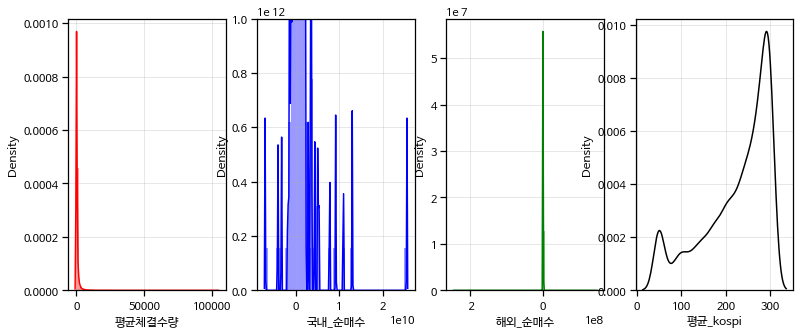

In [178]:
fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(13, 5))
sns.distplot(new_cus['평균체결수량'], kde=True, hist=True,color = 'r',ax=axs[0])
sns.distplot(new_cus['국내_순매수'], kde=True, hist=True,color = 'b', ax=axs[1]).set(ylim=(0, None))
sns.distplot(new_cus['해외_순매수'], kde=True, hist=True,color = 'g', ax=axs[2])
sns.distplot(new_cus['평균_kospi'], kde=True, hist=False,color = 'k', ax=axs[3])

평균체결수량, 국내_순매수, 해외_순매수 분포에서 극단치가 존재하여 분포를 확인할 수 없었습니다. 따라서 극단치 조정이 필요하다고 판단하여 이상치 제거를 실시했습니다.





이상치 제거는 IQR과 MAD방식을 고려해보았습니다. MAD 방식이 성능적으로 좋다고 알려져 있으나 해당 데이터에 적용해본 결과, 데이터 손실이 너무 많아 IQR 방식을 이용하여 이상치 제거를 진행했습니다.



#### 이상치 제거 컬럼
- 평균체결수량
- 국내_순매수

1) 평균체결수량 이상치 제거 

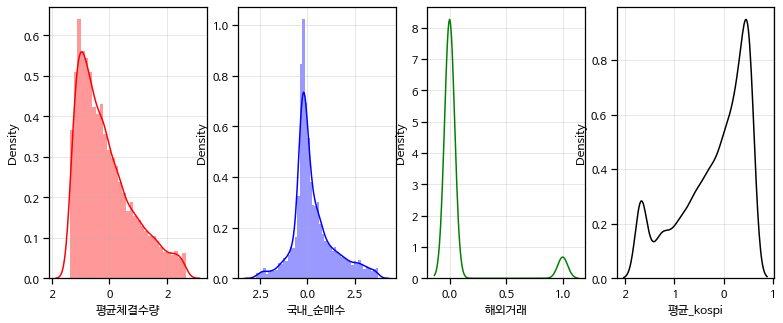

In [179]:
# 이상치 제거 함수 표준편차 기반 IQR
import numpy as np

def get_outlier(df, column, weight=1.5):
  # target 값과 상관관계가 높은 열을 우선적으로 진행
  quantile_25 = np.percentile(df[column].values, 25)
  quantile_75 = np.percentile(df[column].values, 75)

  IQR = quantile_75 - quantile_25
  IQR_weight = IQR*weight
  
  lowest = quantile_25 - IQR_weight
  highest = quantile_75 + IQR_weight
  
  outlier_idx = df[column][ (df[column] < lowest) | (df[column] > highest) ].index
  return outlier_idx

# 평균체결수량 컬럼 함수 사용해서 이상치 값 삭제 후 정적편포의 형태를 강하게 띄고 있으므로 정규화를 위해 제곱근변환을 실시했습니다. 
outlier_idx = get_outlier(df=new_cus, column='평균체결수량', weight=1.5)
new_cus.drop(outlier_idx, axis=0, inplace=True)
new_cus['평균체결수량'] = preprocessing.scale(np.sqrt(new_cus['평균체결수량']))

# 국내_순매수 컬럼 이상치 제거 후 Robust스케일링을 진행했습니다.
outlier_idx = get_outlier(df=new_cus, column='국내_순매수', weight=1.5)
new_cus.drop(outlier_idx, axis=0, inplace=True)
new_cus.reset_index(inplace=True)
new_cus['국내_순매수'] = preprocessing.robust_scale(new_cus['국내_순매수'])

# 해외_순매수 컬럼같은 경우 0값의 데이터가 많아 극단적으로 0에 편중된 분포를 보였다. 
#IQR과 MAD와 같이 중앙치를 고려한 방법을 사용할땐 0에서 조금만 수치가 벗어나도 이상치로 고려되어 많은 데이터를 잃을 수 있기 때문에 
# 해외 매수매도 거래를 한 경우:1 와 하지 않은 경우:0 으로 변수변환을 시도했다.
new_cus['해외_순매수'] = new_cus['해외_순매수'].apply(lambda x: 1 if x != 0 else 0)
new_cus = new_cus.rename(columns={'해외_순매수':'해외거래'})

# 평균_kospi 컬럼은 이상치가 없어 Robust스케일링만 진행했습니다.
new_cus['평균_kospi'] = preprocessing.robust_scale(new_cus['평균_kospi'])


# 그래프 시각화
fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(13, 5))
sns.distplot(new_cus['평균체결수량'], kde=True, hist=True,color = 'r',ax=axs[0])
sns.distplot(new_cus['국내_순매수'], kde=True, hist=True,color = 'b', ax=axs[1])
sns.distplot(new_cus['해외거래'], kde=True, hist=False,color = 'g', ax=axs[2])
sns.distplot(new_cus['평균_kospi'], kde=True, hist=False,color = 'k', ax=axs[3])

#### 최종 군집화 컬럼
- 고객등급 (범주형)
- 고객투자성향 (범주형)
- 국내 순매수
- 해외 거래 (범주형)
- 평균 체결수량
- kospi종목 평균

#### 2-3. K-means Clustering



#### 1) 범주형 데이터를 위한 인코딩

In [133]:
clus_data = new_cus[['고객등급','고객투자성향','해외거래','국내_순매수','평균체결수량','평균_kospi']]
# 범주형 데이터를 k-means clustering하기위한 인코딩
clus_data = pd.get_dummies(clus_data, columns= ['고객등급','해외거래', '고객투자성향'])

#### 2) 적절한 군집 수 찾기 

K-means Clustering에서 군집개수k를 설정하는 대표적 방법은 Elbow method, Silhouette method 등이 있습니다.  

유클리드 거리측정법을 이용하여 각 클러스터와 클러스터의 중심에서 거리제곱의 평균으로 Distortion 값을 계산했습니다. 
Distortion 그래프를 통해 적절한 클러스터의 개수 k를 찾기위해 Distortion이 줄어드는 크기가 작아지는 곳을 찾는 엘보우 기법을 사용하였습니다

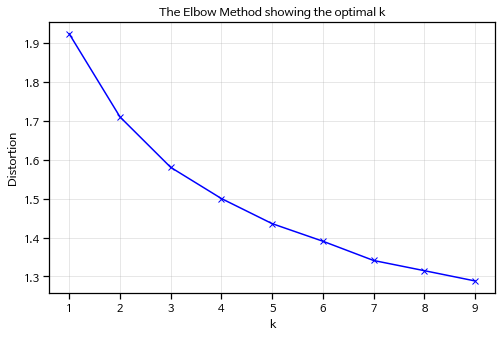

<Figure size 720x432 with 0 Axes>

In [134]:
Z = clus_data
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(Z)
    kmeanModel.fit(Z)
    distortions.append(sum(np.min(cdist(Z, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / Z.shape[0])
# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.figure(figsize=(10,6))
plt.show()

In [135]:
model = KMeans(n_clusters=4,algorithm='auto')
model.fit(clus_data)

predict = pd.DataFrame(model.predict(clus_data))
center = model.cluster_centers_
labels = model.labels_
predict.columns=['predict']

# 결과 합치기
final_df = pd.DataFrame(np.hstack((predict, clus_data)))
# 컬럼명 지정
cols = list(clus_data.columns.values)
cols.insert(0,'group')
final_df.columns = cols

# 그룹이름 변경
group_name = {0: 'gr01',
               1: 'gr02',
               2: 'gr03',
              3: 'gr04'}

final_df['group'] = final_df['group'].replace(group_name)
new_cus['group'] = final_df['group']

#### 3) 차원축소 

<function matplotlib.pyplot.show>

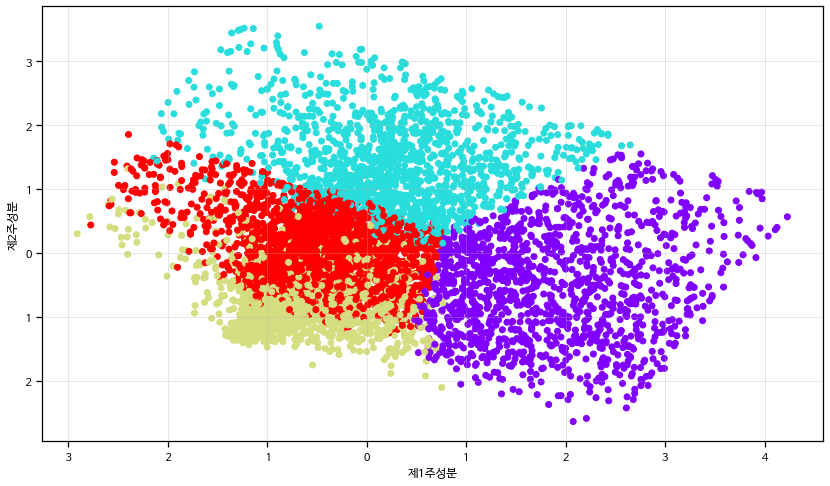

In [180]:
# 2개의 차원으로 축소
transformed = PCA(n_components=2).fit_transform(clus_data)

pca_df = pd.DataFrame(data=transformed, columns=['제1주성분','제2주성분']) 
plt.figure(figsize=(14,8))
plt.scatter('제1주성분','제2주성분',data=pca_df,c=labels,cmap='rainbow')
plt.xlabel('제1주성분')
plt.ylabel('제2주성분')
plt.show

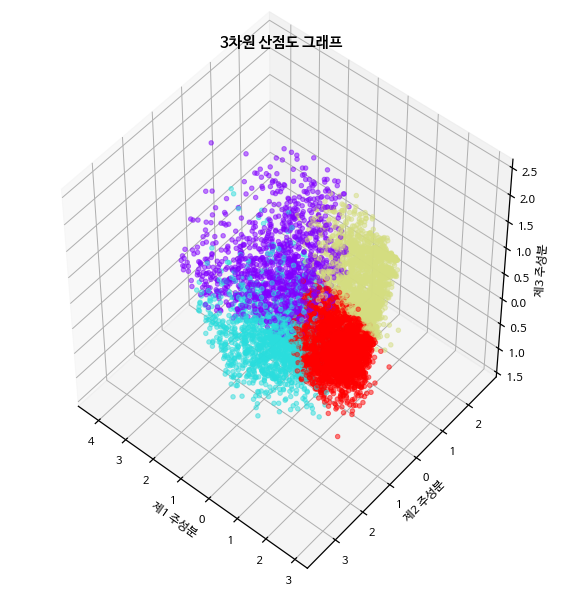

In [137]:
#군집 시각화 (3차원)
from mpl_toolkits.mplot3d import Axes3D
dim3 = PCA(n_components=3).fit_transform(clus_data)

fig = plt.figure(figsize=(8, 8))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=130)
ax.scatter(dim3[:,0], dim3[:,1], dim3[:,2], c=labels, alpha=0.5, cmap='rainbow')
ax.set_title('3차원 산점도 그래프',fontweight ="bold",fontsize =15)
ax.set_xlabel('제1 주성분')
ax.set_ylabel('제2 주성분')
ax.set_zlabel('제3 주성분')
plt.show()

In [141]:
pca = PCA(n_components=4)
pca.fit_transform(clus_data)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[0.32237203 0.22696632 0.09710601 0.08548379]
[0.32237203 0.54933835 0.64644436 0.73192815]


주성분수가 2개일대 약 55%, 3개일때 약 65%의 설명력을 보여줍니다. 따라서 위와같이 차원을 줄인 그래프는 정확하지 않지만 대충의 군집 분포정도는 확인할 수 있습니다. 

gr04    2947
gr03    1680
gr02    1385
gr01    1341
Name: group, dtype: int64

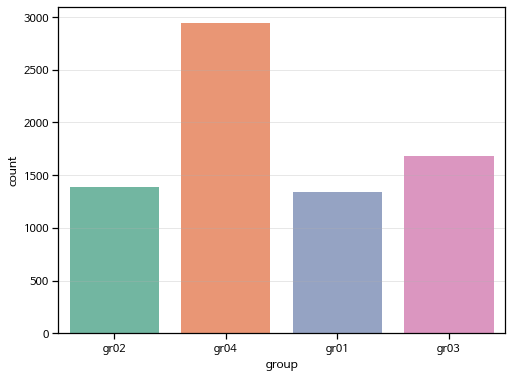

In [142]:
# 그룹 별 개수 시각화
rcParams['figure.figsize'] = 8,6
sns.countplot(new_cus['group'], palette="Set2")
new_cus['group'].value_counts()

어느정도 비슷크기의 군집 4개가 완성되었습니다. 이제 군집화된 그룹을 유사고객군으로 묶어 분석해보도록 하겠습니다.

#### 4) 유사 고객군 분석
- group01
- group02
- group03
- group04


---


  #### **EDA(탐색적 데이터분석)**
  **ㄱ. 연령분포**  
  
  **ㄴ. 고객등급 분포**  

  **ㄷ. 고객투자성향 분포**

  **ㄹ. 국내 및 해외 매수매도량**

  **ㅁ. 국내 및 해외 투자종목**


##### 이제 그룹별 컬럼의 EDA(탐색적 데이터분석)를 통해 그룹특성을 알아보겠습니다.
우선 거래데이터와 고객데이터를 그룹별 데이터프레임으로 만들었습니다.

In [143]:
# 국내거래 그룹 데이터
df_kr_gr = pd.merge(df_kr,new_cus[['고객번호','group']],how='left',on='고객번호').dropna()
df_kr_gr.reset_index(inplace=True)
df_kr_gr = df_kr_gr.drop(['index'],axis=1)

# 그룹 분할
df_kr_gr01 = df_kr_gr[df_kr_gr['group']=='gr01']
df_kr_gr02 = df_kr_gr[df_kr_gr['group']=='gr02']
df_kr_gr03 = df_kr_gr[df_kr_gr['group']=='gr03']
df_kr_gr04 = df_kr_gr[df_kr_gr['group']=='gr04']

# 해외거래 그룹 데이터
df_oss_gr = pd.merge(df_oss,new_cus[['고객번호','group']],how='left',on='고객번호').dropna()
df_oss_gr.reset_index(inplace=True)
df_oss_gr = df_oss_gr.drop(['index'],axis=1)

# 그룹 분할
df_oss_gr01 = df_oss_gr[df_oss_gr['group']=='gr01']
df_oss_gr02 = df_oss_gr[df_oss_gr['group']=='gr02']
df_oss_gr03 = df_oss_gr[df_oss_gr['group']=='gr03']
df_oss_gr04 = df_oss_gr[df_oss_gr['group']=='gr04']

# 고객데이터 병합
cus_gr = pd.merge(cus_re,new_cus[['고객번호','group']],how='left',on='고객번호').replace({'고객등급':{'_ ':'등급없음'},'고객투자성향':{'-':'정보제공미동의'}}).dropna()
cus_gr1=cus_gr[cus_gr['group']=='gr01']
cus_gr2=cus_gr[cus_gr['group']=='gr02']
cus_gr3=cus_gr[cus_gr['group']=='gr03']
cus_gr4=cus_gr[cus_gr['group']=='gr04']

##### **ㄱ. 연령분포**

In [144]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
grade1 = pd.DataFrame(cus_gr1['연령대'].value_counts()).reset_index() 
grade1 = grade1.rename({'index':'연령대','연령대':'count'},axis='columns')
grade2 = pd.DataFrame(cus_gr2['연령대'].value_counts()).reset_index() 
grade2 = grade2.rename({'index':'연령대','연령대':'count'},axis='columns')
grade3 = pd.DataFrame(cus_gr3['연령대'].value_counts()).reset_index() 
grade3 = grade3.rename({'index':'연령대','연령대':'count'},axis='columns')
grade4 = pd.DataFrame(cus_gr4['연령대'].value_counts()).reset_index() 
grade4 = grade4.rename({'index':'연령대','연령대':'count'},axis='columns')

fig = make_subplots(rows=1, cols=4, specs=[[{'type':'domain'},{'type':'domain'},{'type':'domain'},{'type':'domain'}]],subplot_titles = ['group01','group02','group03','group04'])
fig.add_trace(go.Pie(labels=grade1['연령대'], values=grade1['count'], sort = True,name='gr01',hole=.3,marker_colors=['#000049','#5C1DB5','#A465FD','#E14894','#B2EBF4','#FFD6FF','#FFFFFF'] ,pull=[0,0, 0,0, 0,0.0]), 1, 1)
fig.add_trace(go.Pie(labels=grade2['연령대'], values=grade2['count'], sort = True, name='gr02',hole=.3,pull=[0.2,0.2, 0,0, 0,0.0]), 1, 2)
fig.add_trace(go.Pie(labels=grade3['연령대'], values=grade3['count'], sort = True, name='gr03',hole=.3,pull=[0,0, 0,0, 0,0.0]), 1, 3)
fig.add_trace(go.Pie(labels=grade4['연령대'], values=grade4['count'], sort = True, name='gr04',hole=.3,pull=[0,0, 0,0, 0,0.0]), 1, 4)
fig.update_layout(title_text='그룹별 연령대 비율', legend = {"traceorder" : "normal"})
fig.show()

그룹1,그룹3,그룹4 모두 45대와 50대의 연령대가 약 30%를 차지하고 있지만, 그룹2는 25~35대가 1,2위를 차지하고 있습니다. 

이를 통해, **그룹2는 젊은 층의 고객이 많은 고객군의 특징으로 확인했습니다.**

##### **ㄴ. 고객등급 분포**

In [73]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
grade1 = pd.DataFrame(cus_gr1['고객등급'].value_counts()).reset_index() 
grade1 = grade1.rename({'index':'고객등급','고객등급':'count'},axis='columns')
grade2 = pd.DataFrame(cus_gr2['고객등급'].value_counts()).reset_index() 
grade2 = grade2.rename({'index':'고객등급','고객등급':'count'},axis='columns')
grade3 = pd.DataFrame(cus_gr3['고객등급'].value_counts()).reset_index() 
grade3 = grade3.rename({'index':'고객등급','고객등급':'count'},axis='columns')
grade4 = pd.DataFrame(cus_gr4['고객등급'].value_counts()).reset_index() 
grade4 = grade4.rename({'index':'고객등급','고객등급':'count'},axis='columns')

fig = make_subplots(rows=1, cols=4, specs=[[{'type':'domain'},{'type':'domain'},{'type':'domain'},{'type':'domain'}]],subplot_titles = ['group01','group02','group03','group04'])
fig.add_trace(go.Pie(labels=grade1['고객등급'], values=grade1['count'], sort = True,name='gr01',hole=.3,marker_colors=['#CC3D3D','#FFA7A7','#FFE08C','#CEF279','#B2EBF4','#B5B2FF','#BDBDBD'] ,pull=[0.2, 0,0, 0,0.0]), 1, 1)
fig.add_trace(go.Pie(labels=grade2['고객등급'], values=grade2['count'], sort = True, name='gr02',hole=.3,pull=[0.2, 0,0, 0,0.0]), 1, 2)
fig.add_trace(go.Pie(labels=grade3['고객등급'], values=grade3['count'], sort = True, name='gr03',hole=.3,pull=[0.2, 0,0, 0,0.0]), 1, 3)
fig.add_trace(go.Pie(labels=grade4['고객등급'], values=grade4['count'], sort = True, name='gr04',hole=.3,pull=[0.2, 0,0, 0,0.0]), 1, 4)
fig.update_layout(title_text='그룹별 고객등급 비율', legend = {"traceorder" : "normal"})
fig.show()

그룹별 고객의 등급을 비교해보았습니다. 그룹1과 그룹4는 등급없음보다 블루등급의 고객이 많았습니다. 대체적으로 등급없음-블루-그린-로얄 순위였습니다. 
**그중, 특징적인 모습은 그룹4에서 약 38%로 그린이 2번째로 많은 비율을 차지했습니다.** 그리고 등급없음이 다른 그룹과 달리 현저히 적은 크기라는 것을 확인할 수 있었습니다. 

**그룹4의 고객등급의 약 90%는  블루와 그린, 로얄로 이루어져있습니다.**

##### **ㄷ. 고객투자성향 분포**

In [74]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
grade1 = pd.DataFrame(cus_gr1['고객투자성향'].value_counts()).reset_index() 
grade1 = grade1.rename({'index':'고객투자성향','고객투자성향':'count'},axis='columns')
grade2 = pd.DataFrame(cus_gr2['고객투자성향'].value_counts()).reset_index() 
grade2 = grade2.rename({'index':'고객투자성향','고객투자성향':'count'},axis='columns')
grade3 = pd.DataFrame(cus_gr3['고객투자성향'].value_counts()).reset_index() 
grade3 = grade3.rename({'index':'고객투자성향','고객투자성향':'count'},axis='columns')
grade4 = pd.DataFrame(cus_gr4['고객투자성향'].value_counts()).reset_index() 
grade4 = grade4.rename({'index':'고객투자성향','고객투자성향':'count'},axis='columns')

fig = make_subplots(rows=1, cols=4, specs=[[{'type':'domain'},{'type':'domain'},{'type':'domain'},{'type':'domain'}]],subplot_titles = ['group01','group02','group03','group04'])
fig.add_trace(go.Pie(labels=grade1['고객투자성향'], values=grade1['count'], sort = True,name='gr01',hole=.3,marker_colors=['#000049','#5C1DB5','#A465FD','#E14894','#B2EBF4','#FFD6FF','#FFFFFF'] ,pull=[0,0.2, 0,0, 0,0.0]), 1, 1)
fig.add_trace(go.Pie(labels=grade2['고객투자성향'], values=grade2['count'], sort = True, name='gr02',hole=.3,pull=[0,0.2, 0,0, 0,0.0]), 1, 2)
fig.add_trace(go.Pie(labels=grade3['고객투자성향'], values=grade3['count'], sort = True, name='gr03',hole=.3,pull=[0,0.2, 0.2,0, 0,0.0]), 1, 3)
fig.add_trace(go.Pie(labels=grade4['고객투자성향'], values=grade4['count'], sort = True, name='gr04',hole=.3,pull=[0,0.2, 0,0, 0,0.0]), 1, 4)
fig.update_layout(title_text='그룹별 고객투자성향 비율', legend = {"traceorder" : "normal"})
fig.show()

그룹별 고객투자성향에서는 공통적인 1위인 해당사항없음을 제외하면, 그룹2와 그룹3에서는 위험중립형이, 그룹1과 그룹4에서는 적극투자형이 큰 비율을 보였습니다. 

그룹1, 그룹2, 그룹4는 적극투자형과 위험중립형이 2,3번째로 많은 부분을 차지하고 있지만, **그룹3의 2번째로 큰 비율은 안정추구형입니다. 안정 추구형의 크기가 상대적으로 크고, 공격투자형은 적은 크기이기 때문에 그룹3은 대체적으로 안정적인 투자를 추구할 것으로 예상됩니다.** 
또한, 그룹2는 위험중립형, 적극투자형, 안정추구형의 비율이 크게 차이 나지 않았습니다. 

##### **ㄹ. 국내 - 해외 매수매도량**

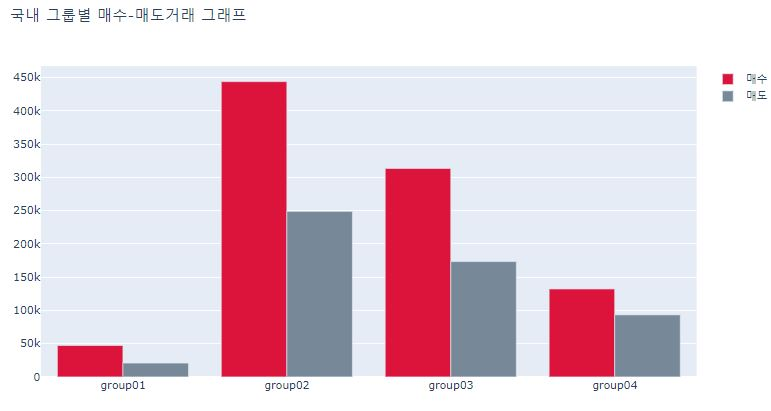

In [145]:
'''
configure_plotly_browser_state()
init_notebook_mode(connected=False)
x=['group01', 'group02', 'group03','group04']
kr_buy = [len(df_kr_gr01[df_kr_gr01['매매구분코드']=='매수']),len(df_kr_gr02[df_kr_gr02['매매구분코드']=='매수']),len(df_kr_gr03[df_kr_gr03['매매구분코드']=='매수']),len(df_kr_gr04[df_kr_gr04['매매구분코드']=='매수'])]
kr_sell = [len(df_kr_gr01[df_kr_gr01['매매구분코드']=='매도']),len(df_kr_gr02[df_kr_gr02['매매구분코드']=='매도']),len(df_kr_gr03[df_kr_gr03['매매구분코드']=='매도']),len(df_kr_gr04[df_kr_gr04['매매구분코드']=='매도'])]
fig = go.Figure(data=[
    go.Bar(name='매수', x=x, y=kr_buy,marker_color='crimson'),
    go.Bar(name='매도', x=x, y=kr_sell,marker_color='lightslategrey')],
    layout=  go.Layout(title='국내 그룹별 매수-매도거래 그래프'))
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

import plotly.graph_objects as go
x=['group01', 'group02', 'group03','group04']
oss_buy = [len(df_oss_gr01[df_oss_gr01['매매구분코드']=='매수']),len(df_oss_gr02[df_oss_gr02['매매구분코드']=='매수']),len(df_oss_gr03[df_oss_gr03['매매구분코드']=='매수']),len(df_oss_gr04[df_oss_gr04['매매구분코드']=='매수'])]
oss_sell = [len(df_oss_gr01[df_oss_gr01['매매구분코드']=='매도']),len(df_oss_gr02[df_oss_gr02['매매구분코드']=='매도']),len(df_oss_gr03[df_oss_gr03['매매구분코드']=='매도']),len(df_oss_gr04[df_oss_gr04['매매구분코드']=='매도'])]
fig2 = go.Figure(data=[
    go.Bar(name='매수', x=x, y=oss_buy,marker_color='crimson'),
    go.Bar(name='매도', x=x, y=oss_sell,marker_color='lightslategrey')],
    layout=  go.Layout(title='해외 그룹별 매수-매도거래 그래프'))
# Change the bar mode
fig2.update_layout(barmode='group')
fig2.show()
'''
Image('/content/gdrive/MyDrive/NH/pic/그룹국내.JPG')

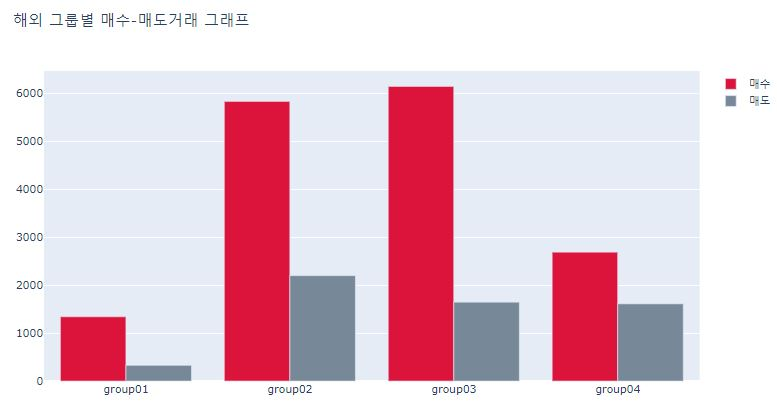

In [146]:
Image('/content/gdrive/MyDrive/NH/pic/그룹해외.JPG')

**그룹1의 경우 국내와 해외거래에서 모두 매수매도의 양이 다른 그룹보다 적은 차이를 보이고있습니다.** 
**이를 통해, 매도 거래역시 활발하게 이루어진다는 것을 알 수 있습니다.** 

**그룹4의 해외거래 그래프에서는 해외종목 매수에 비해 매도는 많이 이루어지지 않고 있습니다.** 

##### **ㅁ. 국내 - 해외 인기투자 종목**

###### - group01

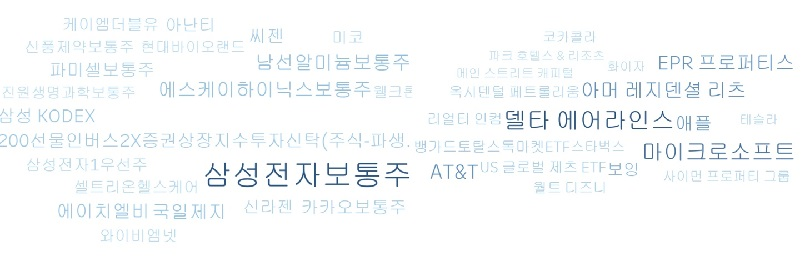

In [149]:
Image('/content/gdrive/MyDrive/NH/pic/1.jpg')

그룹1의 인기 투자종목은 삼성전자, 델타에어라인스, 마이크로소프트, 아머 레지덴셜 리츠, SK하이닉스입니다. 

###### - group02

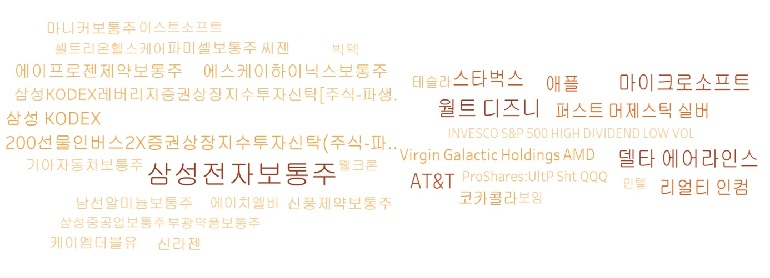

In [150]:
Image('/content/gdrive/MyDrive/NH/pic/2.jpg')

그룹2의 인기 투자종목은 삼성전자,월트디즈니, 200선물인버스2X증권상장, AT&T, 델타에어라인스, 마이크로소프트,애플 등이 있습니다.

###### - group03

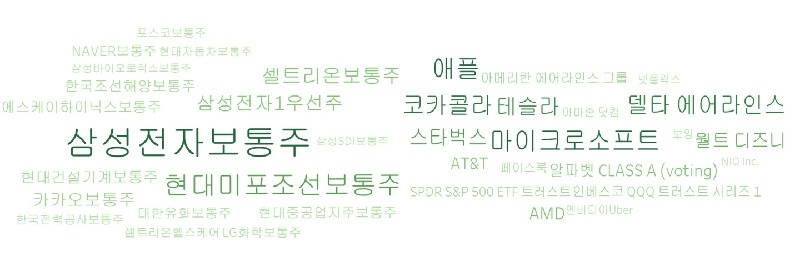

In [151]:
Image('/content/gdrive/MyDrive/NH/pic/3.jpg')

그룹3의 인기 투자종목은 삼성전자, 현대미포조선, 셀트리온, 애플, 마이크로소프트, 델타에어라인스, 코카콜라, 테슬라가 있습니다.

###### - group04

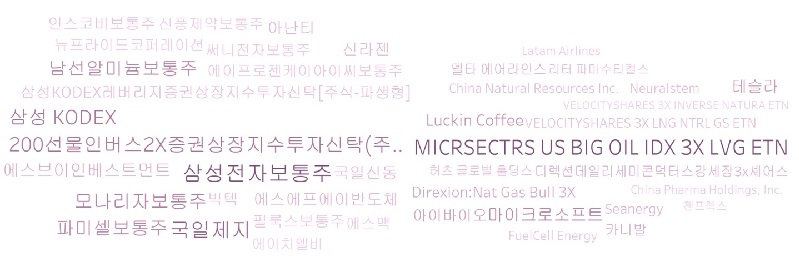

In [152]:
Image('/content/gdrive/MyDrive/NH/pic/4.jpg')

그룹4의 인기 투자종목은 삼성전자, 국인제지, 삼성KODEX,MICRECTRS US BIG OIL IDX 3X LVG ETN 이 있습니다. 



#### **유사고객 집단군 특징결과**

< 그룹1 >  
- X세대의 연령이 많음
- '블루고객등급'과 '등급없음' 이 많음 
- 적극,위험중립,공격투자 성향이 많음 
- **거래량이 국내와 해외 모두 적은 소극적 투자 집단으로 보임**
- 매수와 매도 비율이 비슷함

< 그룹2 >  
- **YZ세대가 몰려있음**
- 위험중립형, 적극투자형, 안전추구형
- 적극적인 매수와 매도비율이 2배 정도 차이남

< 그룹3 > 
- 복합적 세대
- 안정적으로 투자하려는 경향   
( 위험중립, 안전투자,적극투자로 많고, 특히 공격투자가 적음)
- **거래가 가장 소극적인 집단**

< 그룹4 >  
- X세대 많음
- **약 90% 등급을 보유하고 있음**
- 해당사항 없음이 가장 적음, 적극,위험중립,안전추구
- 해외 투자를 많이 하며 매도보다는 매수주문을 많이함
- **활발히 주식하는 집단**


## **Ⅲ. 분석 결과 도출**

---

투자자데이터를 바탕으로 분석한 결과,

**남성 > 여성**

**위험중립형, 공격투자형 > 안전추구형, 적극투자형**

**블루등급 > 그린, 로얄, 골드 등급**

**모바일트레이딩 시스템 (MTS) > 홈트레이딩 시스템 (HTS)**

이 더 우세함을 알 수 있었습니다. 


X세대와 달리 안정적인 투자만을 고집하지 않는 것이 Y&Z세대의 특징입니다. 투자 데이터의 주식 종목을 워드 클라우드로 시각화해본 결과, 미국의 프로셰어즈 울트라숏 QQQ 이 우세했던 것처럼 과감히 투자하여 단기적으로 이익을 보려고 하는 경향이 있습니다.


또한 코로나의 영향으로 올해 3월달에 계좌를 급격히 개설한 것으로 보아, 시장조사를 했던 결과와 동일하게 투자세계로 등 떠밀리듯 유입됐다고 보여집니다. 

보유 계좌대비 실제 사용하는 계좌에서는 1개 혹은 2개를 만들고 이 계좌만 사용하는 모습을 확인했습니다. X세대의 경우 30 ~ 60개의 계좌를 만들고 주로 사용하는 계좌가 1 ~ 2개였다면 Y&Z세대의 경우 실사용율 100%가 66% 달했습니다. 

이러한 결과로 보아, 예전에는 계좌를 만들면 실적으로 이어지는 영업점 단말이 우세했음을 알 수 있습니다. 현재에는 MTS를 주로 사용하며 이벤트나 상품과 같은 실적으로 이어지는 경우가 드물고, 계좌계설에 제한이 생겨 이와 같은 현상이 일어났다고 파악됩니다.

**Y&Z세대는 디지털 및 SNS의 사용에 익숙하고 트렌드에 민감한 특징을 가지고 있습니다. 코로나 이후 주식시장은 더욱 급변하고 있고, Y&Z세대는 이에 발 맞춰 빠르게 트렌드를 파악하여 투자하려고 합니다. 그러나, 많은 정보를 SNS나 유튜브를 통해 쉽게 얻을 수 있기 때문에 단편적인 지식과 정보에 휘둘려 판단하곤 합니다. 따라서, Y&Z세대는 정확한 정보를 수집하고 검토하여 투자를 신중하게 할 필요가 있습니다.** 



---



지금까지 군침이 SSACK팀의 이효진, 전소향이었습니다. 끝까지 잘 봐주셔서 감사합니다!